# Detection Algorithms

## Object Localization

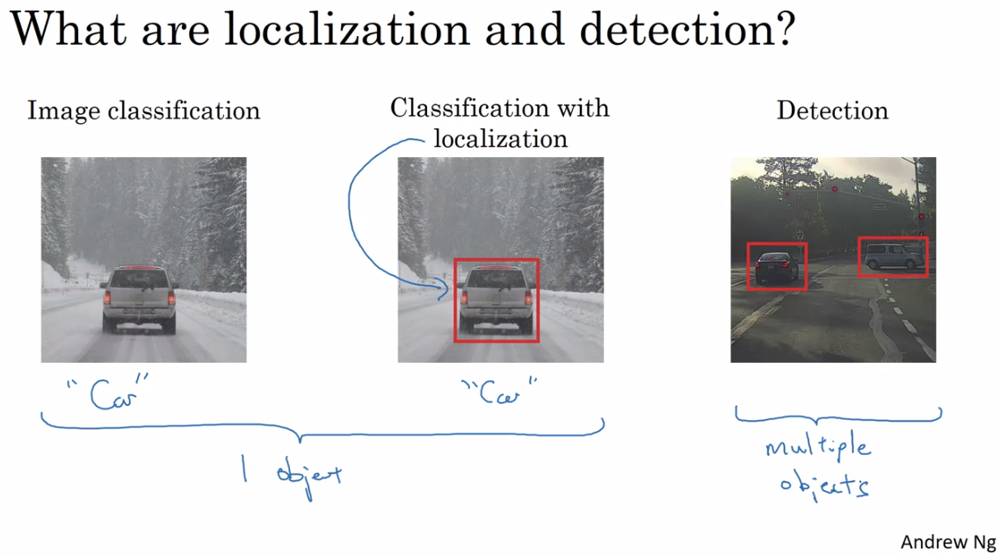

### Classification with Localization
- Assume that we have built a NN that classifies object classes (e.g. softmax as activation function for the last layer).
- For **localization**, we change the neural network by adding a few more output units that outputs a bounding box for the object that we want to localize.
    - More specifically, we need to output 4 more numbers $b_{x}, b_{y}, b_{h}, b_{w}$, which together parameterize the bounding box.
        
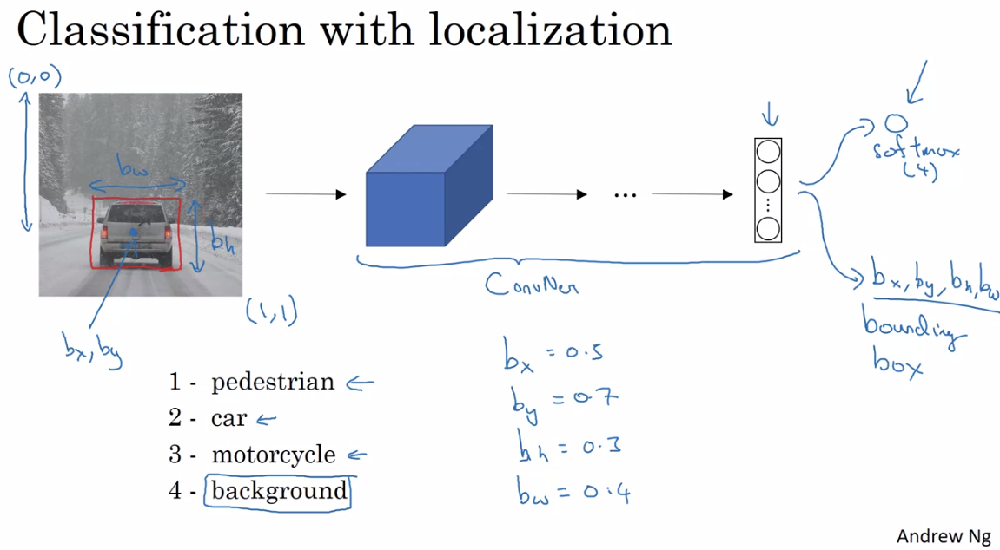

- Defining the Target Label $y$
    - Assume there are 4 classes in total - 3 object classes and 1 class for background.
    - $y = \begin{bmatrix} p_{c} \\ b_{x} \\ b_{y} \\ b_{h} \\ b_{w} \\ c_{1} \\ c_{2} \\ c_{3} \end{bmatrix}$
        - $p_{c} = 1$ if there is an object (not background), else $p_{c} = 0$
            - If $p_{c} = 0$, all other elements will be 0 as we don't care.
        - $c_{i} = 1$ if there is an object of class i, else $c_{i} = 0$.
- Loss Function
    - Still assume that there are 4 classes in total, so that the target label $y$ defined above has 8 elements in total.
    - $l(\hat y_{i}, y_{i}) = \begin{cases}
            \sum_{i=1}^{8} (\hat y_{i} - y_{i})^{2} & \text{if } y_{1} = p_{c} = 1\\
            (\hat y_{1} - y_{1})^{2}  & \text{if } y_{1} = p_{c} = 0
        \end{cases}$
        
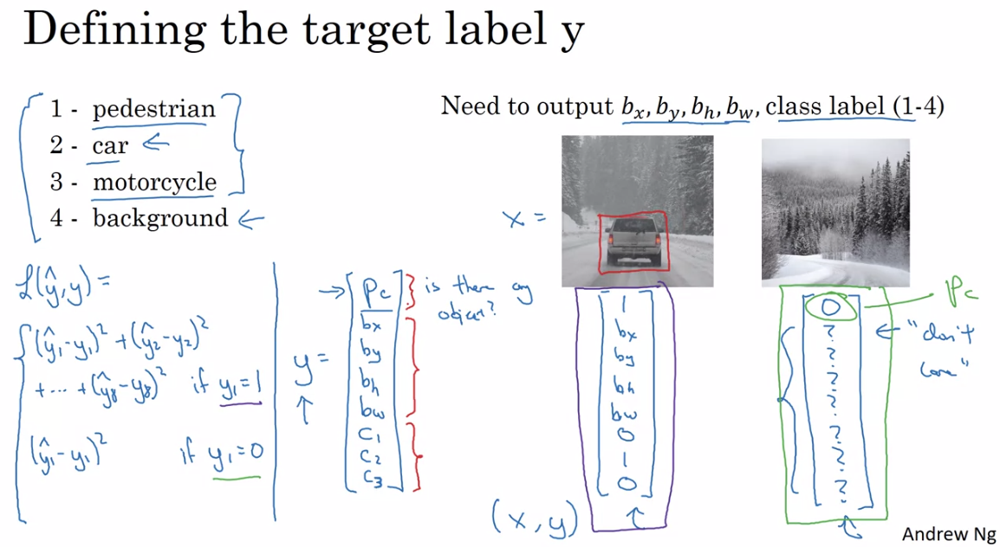

## Landmark Detection
- By selecting a number of **landmarks** in a image and generating a labeled training sets that contains the exact locations of all these landmarks, you can train a NN to output the exact locations of landmarks.

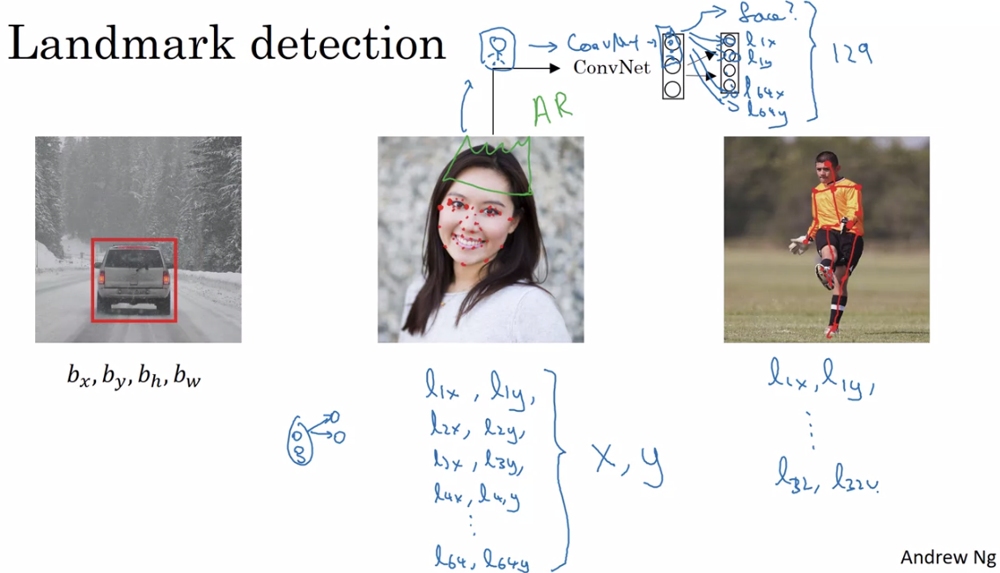

## Object Detection
- Object detection can be realized using the **Sliding Windows Detection** algorithm.
    - We first train a COnvNet classifier for the object using **closely cropped images**.
    - Then, we run a small window across the image. 
        - For each position, we pass the sqaured region inside of the window as input to the ConvNet and make a prediction.
    - After running through the entire image, we increase the window size by a little and do it again.
- The biggest disadbantage for this algorithm is **high computational cost**.
    - In order to detect the object, we have to slide the window by small steps when running it across the entire image.
    - This means that we will feed a lot of squared regions into the ConvNet and make predictions for each.
    - ConvNet classifier is a relatively complicated algorithm, thus using it with the sliding windows detection algorithm is especially slow and computationally expensive.
    
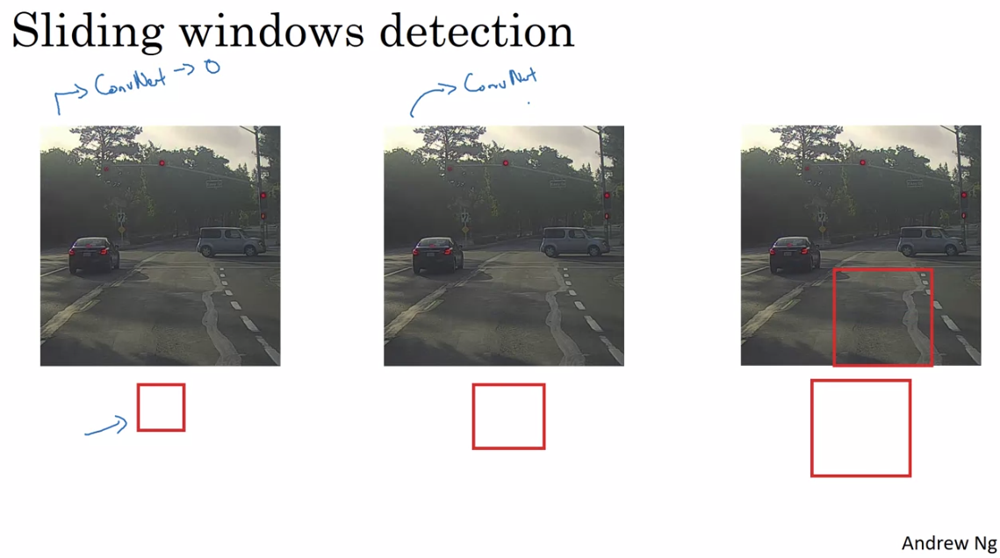

## Convolutional Implementation of Sliding Windows

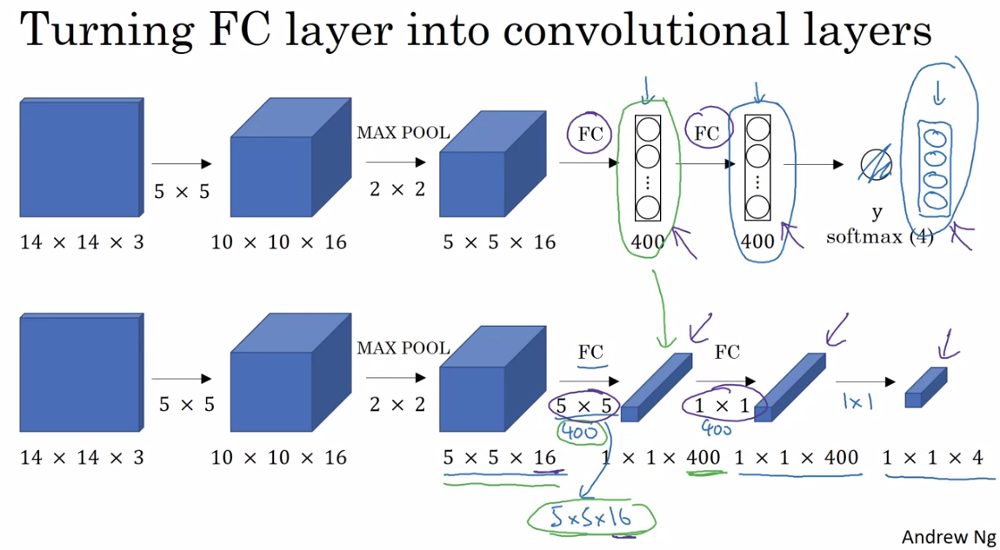

- In the example below, we want to apply the sliding window detection algorithm using $14 \times 14$ window on a $16 \times 16$ or $28 \times 28$ image.
    - One observation is that when the window slides across the image with small strides, there will always be a big overlapped area from the previous position.
    - If we replace the fully connected layers in the detector with convolutional layers (as shown above), we can then compute all window positions in one forward propagation through convolution.
    
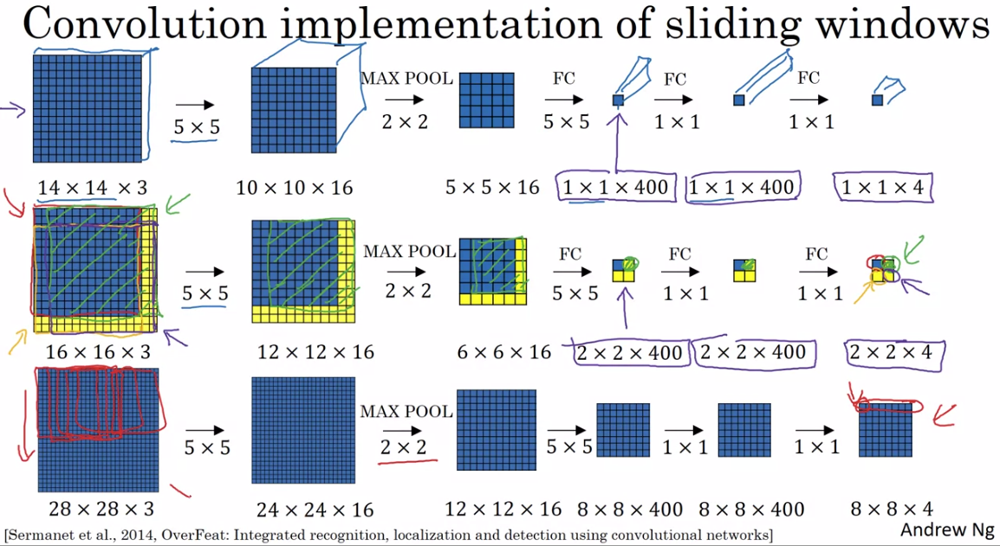

- In other words, in stead of moving the window across the image and make predictions for each position sequentially, convolutional implementation allows us to forward propagate for only once and make predictions for all window positions at the same time.

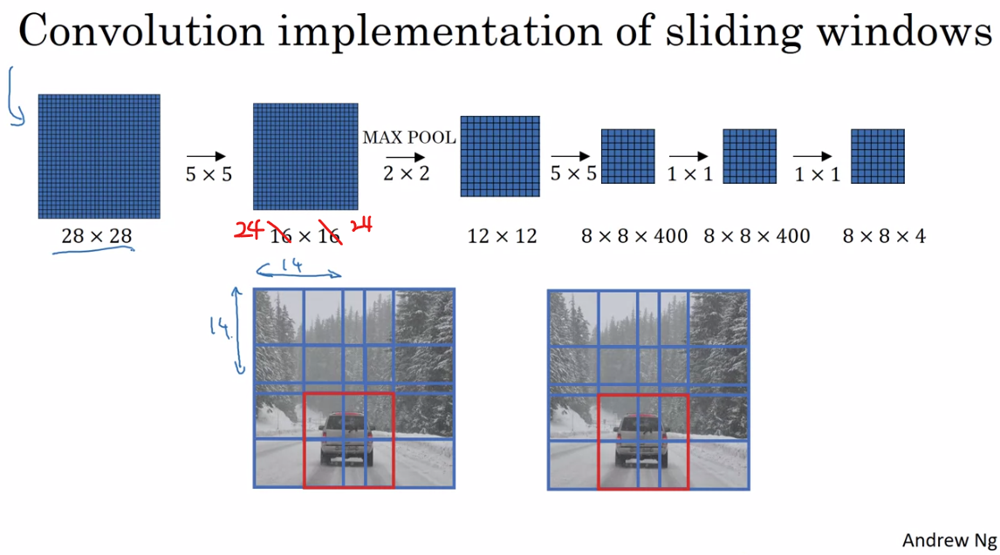

## Bounding Box Predictions
- Although the convolution implementation of sliding windows helps improving the algorithm's efficiency significantly, it still has a big disadvantage that it's NOT garuanteed to output accurate bounding boxes, as the position and shape of bounding box is essentially just a window slided to a certain position.
- **YOLO Algorithm** (You Only Look Once)
    - We divide a image into $n_{grid}$ grid cells.
    - We create labels for the training set by assining a label $y$ introduced in the Classification with Localization algorithm to each of the grid cells.
        - We assign $p_{c} = 1$ if the midpoint of the object is in this grid cell.
    - As a result, the output label for a image is a volume of $n_{grid} \times n_{grid} \times len(y)$
    - We then conduct Convolutional Implementation by training a ConvNet that predicts the output volume in one forward propagation.
    
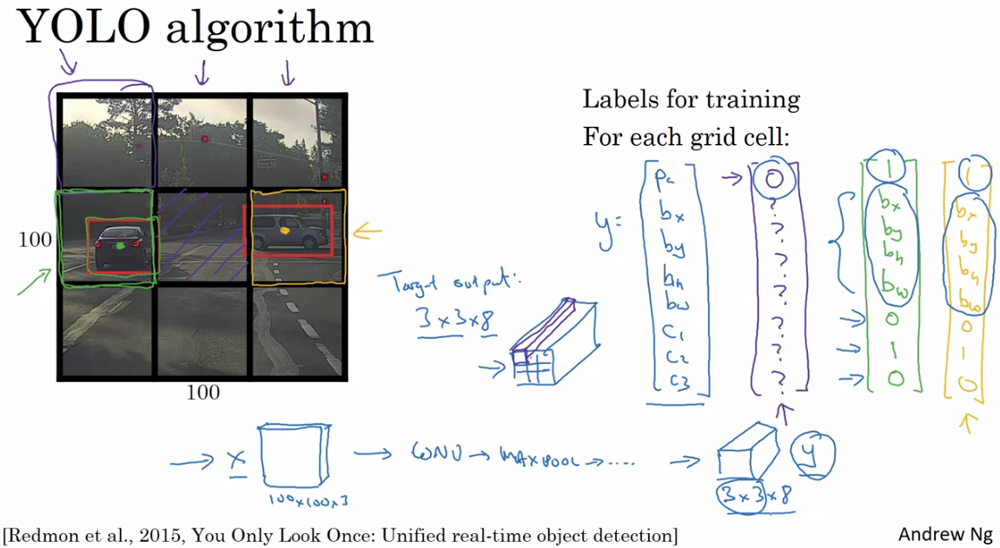

- Specify the Bounding Box
    - $(b_{x}, b_{y})$ represents the midpoint of the object (thus also the bounding box).
        - We define the left upper corner of the grid cell as $(0, 0)$ and the right lower corner as $(1, 1)$.
    - $b_{h}$ and $b_{w}$ specifies the size of the bounding box.
        - Their values are defined relative to the size of the grid cell.
        - They could be bigger than 1 if the object is partially outside of the grid cell.
        
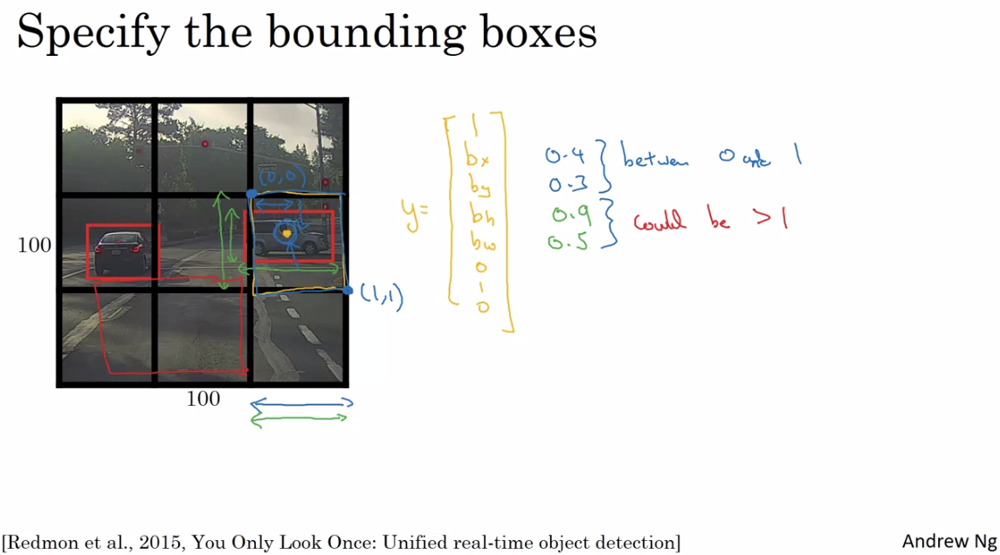

## Intersection Over Union (IoU)
- Evaluating Object Localization
    - $IoU = \frac{size_{intersection}}{size_{union}}$
    - Higher IoU indicates more accurate bounding box.
    
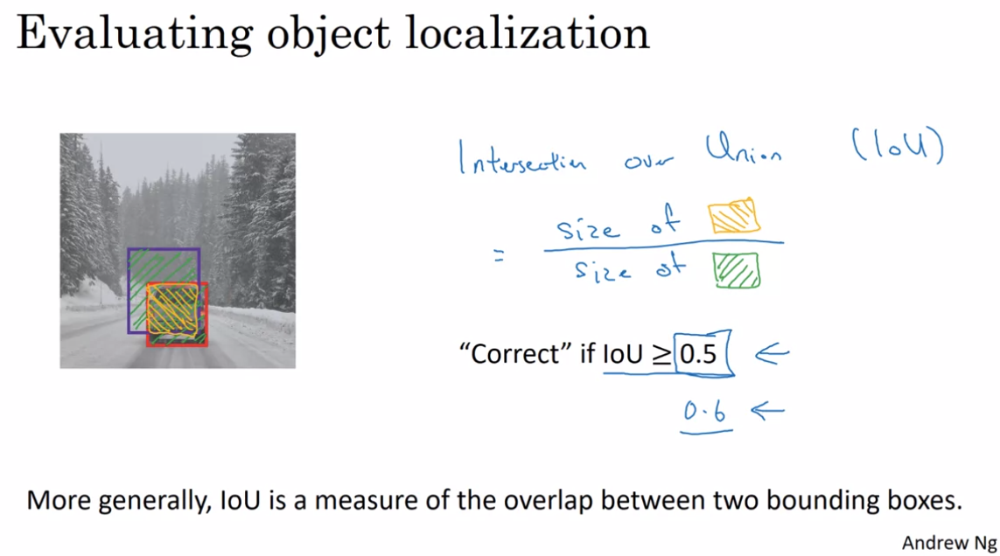

## Non-max Suppression
- Sometimes when an object spans over multiple grid cells, the algorithm will detect the same object more more than one time instead of only returning the grid cell where the midpoint of the object locates in (example below).

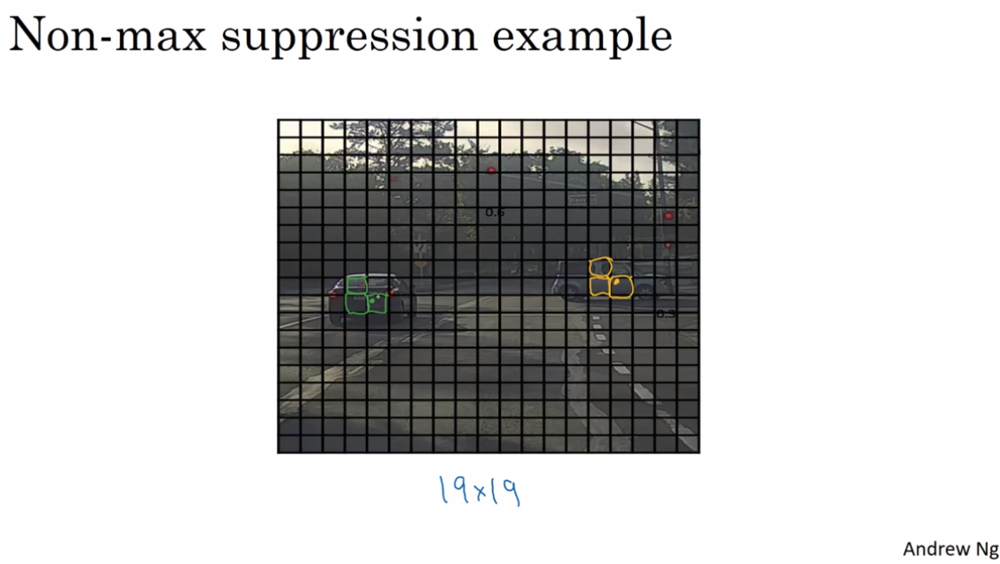

- **Non-max suppression** is a technique that helps your algorithm to only detect each object once.
    - The algorithm will look at all detection probabilities on an object and highlight the highest one.
        - It will then suppress all other detections with high IoU with this highlighted detection to avoid duplicated detection.
    - It will then move on to find the next detection to be highlighted.
    
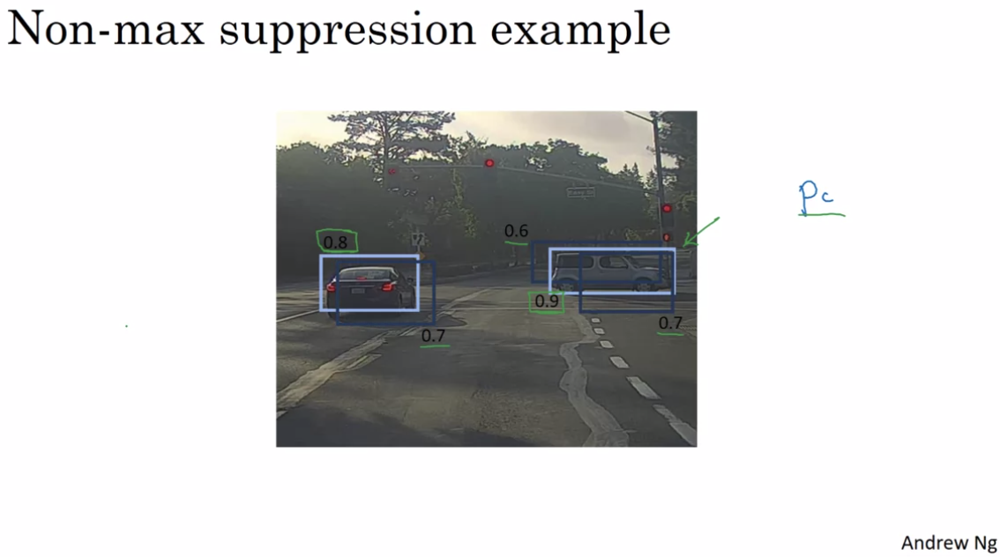

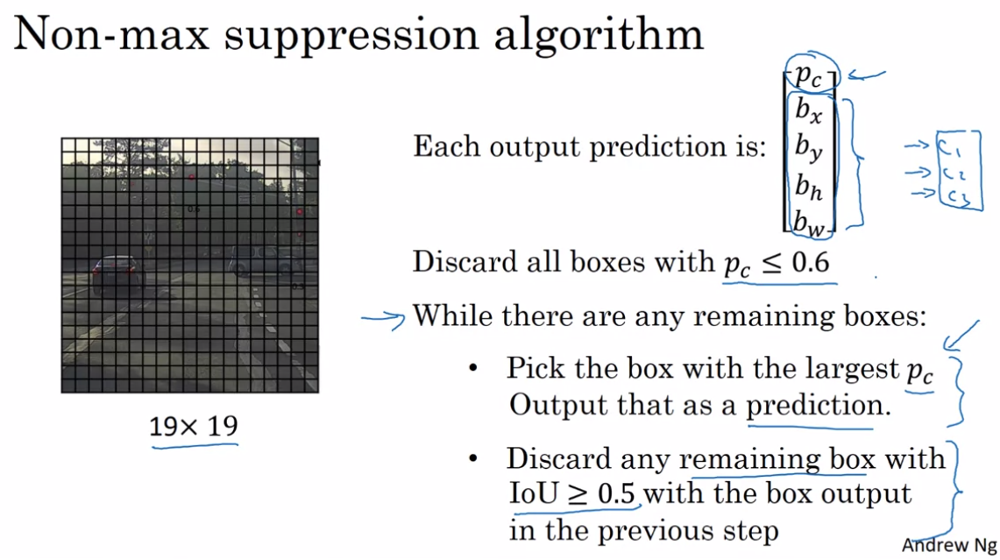

## Anchor Boxes
- Based on the way we define grid cells and label $y$ for each cell, a limitation is that each cell could only detect 1 object.
- **Anchor Boxes** allows each cell to **detect multiple objects** in the same cell.
    - We define anchor boxes of different shapes and redefine the label $y$ as below. 
    - Objects are matched with anchor boxes by IoU.
    
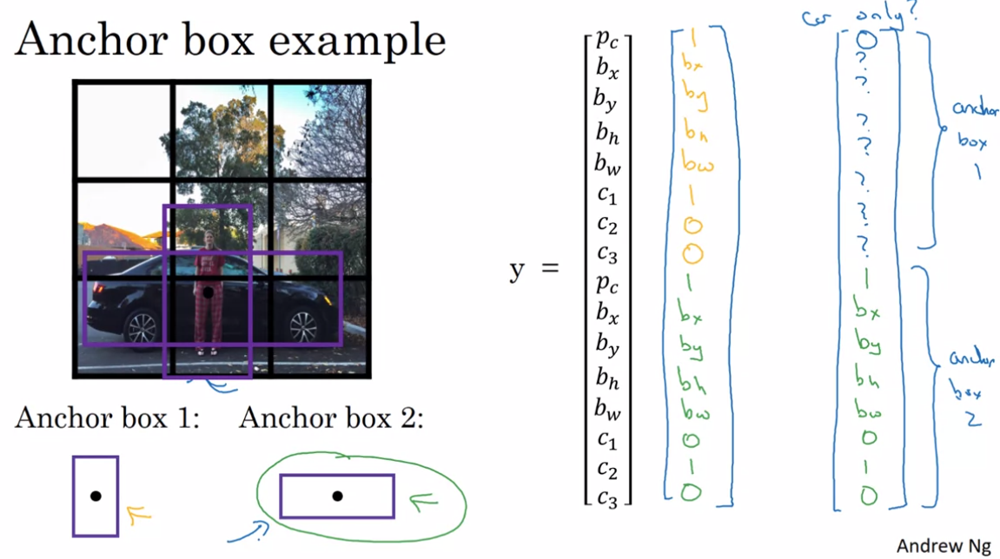

## Putting it Together: YOLO Algorithm
- In the examples below, we'll put the **YOLO** algorithm together with **anchor boxes** as well as **non-max supression**.

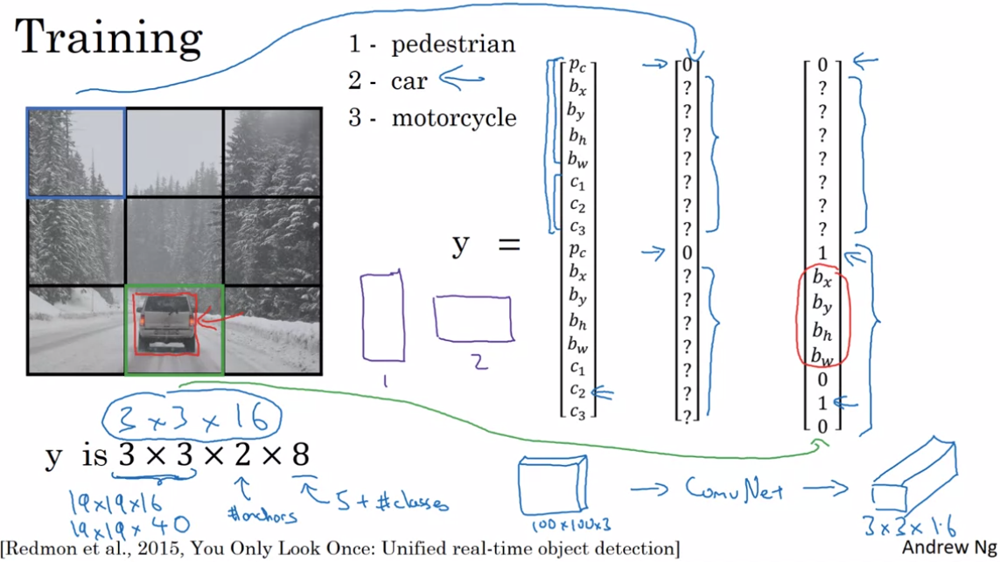

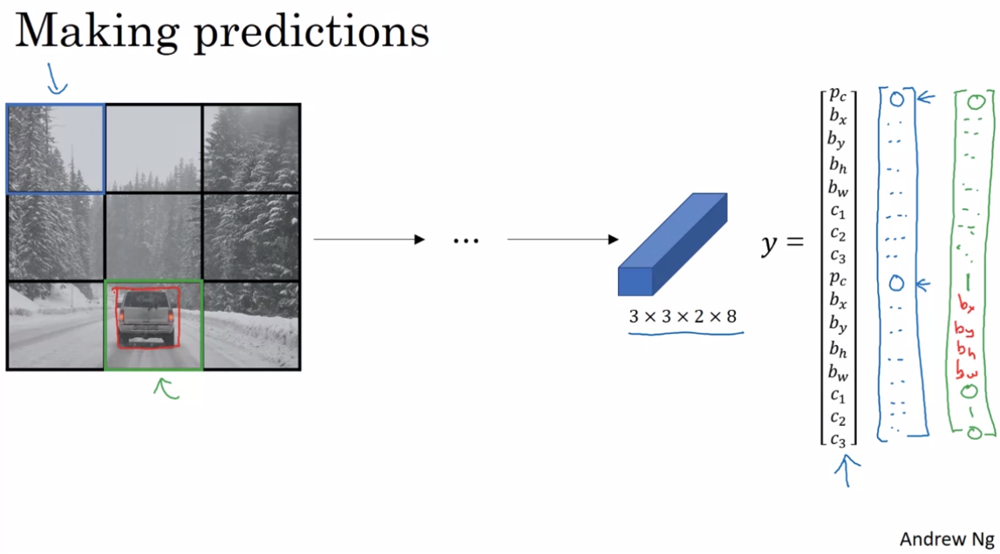

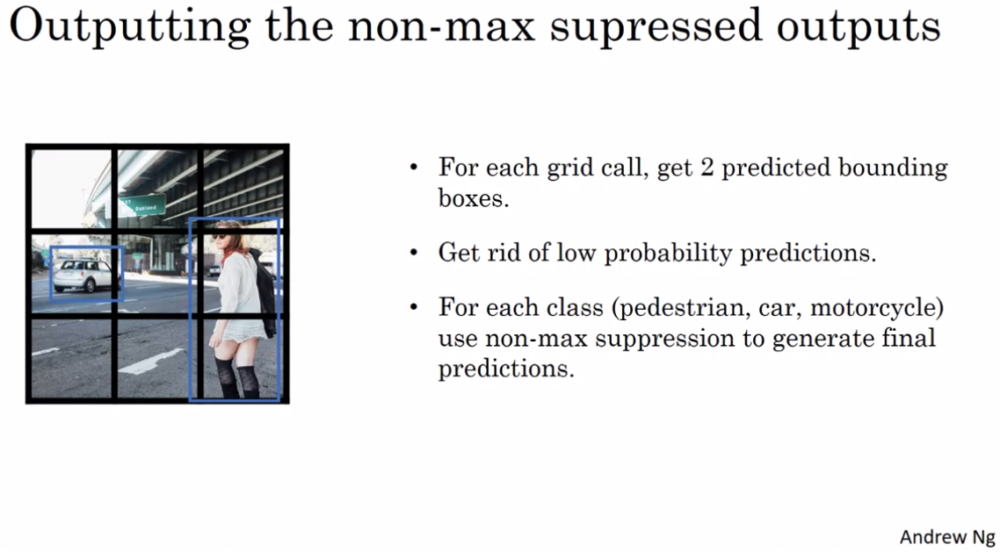

## Region Proposals
- **R-CNN** (Regions with Convolutional Neural Networks)
    - Sometimes we just want to avoid running the ConvNet classifier on all possible positions, including those that are obviously blank.
    - One potential solution is to run **segmentation algorithms** first to propose regions that are more likely to be objects and then slide the window through these positions.
    
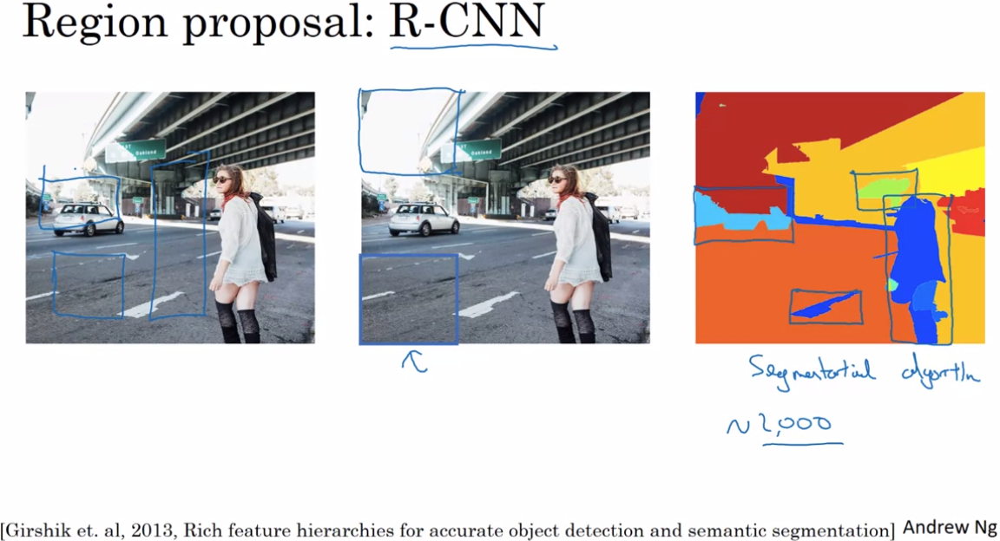

- Although R-CNN methods are still generally slower than the YOLO algorithm, there have been works done to speed it up.

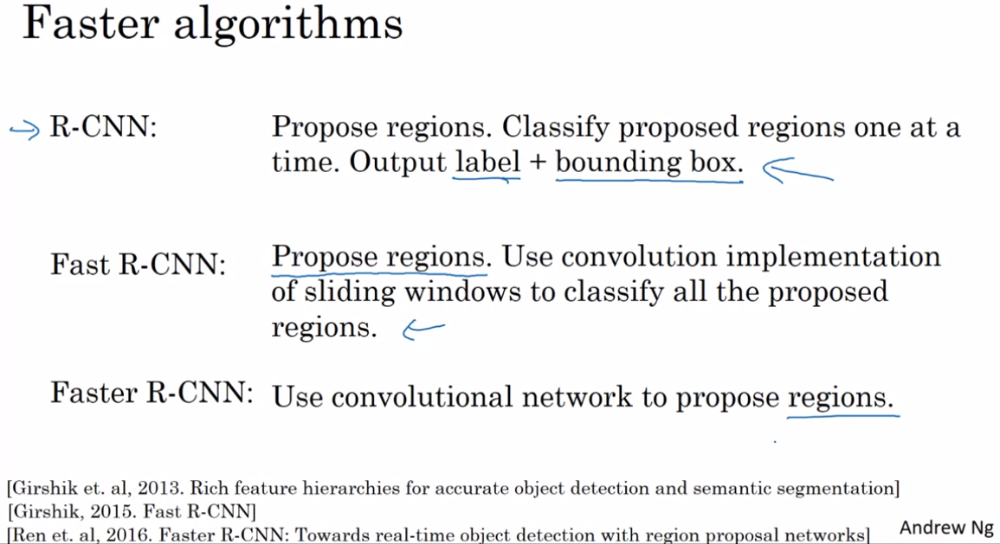